In [1]:
%load_ext autoreload
%autoreload 2
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython import display 
from IPython.display import HTML
import os
from random import randint
plt.style.use('seaborn-v0_8')
#plt.style.available

# Sorting Algorithms

In [2]:
# Sort algo
def bubbleSort(data):
    arr = data.copy()
    n = len(arr)
    barlist = [arr.copy()]
    
    # Run throught all data elements
    for i in range(n):
        # Compare each pair of elements
        for j in range(n-1-i):
                if arr[j] > arr[j + 1]:
                    arr[j], arr[j+ 1] = arr[j + 1], arr[j]
                    barlist.append(arr.copy())
    return barlist

def insertionSort(data):
    arr = data.copy()
    n = len(arr)
    barlist = [arr.copy]
    
    for i in range(1, n):
        key = arr[i]
        j = i-1
        barlist.append([arr.copy(), j+1])
        # move ele right if ele > key 
        while j >= 0 and key < arr[j]:
            arr[j+1], arr[j] = arr[j], arr[j+1]
            barlist.append([arr.copy(), j])
            j -= 1
        # insert the key such that key < ele on the right
        # arr[j+1] = key
        # barlist.append([arr.copy(), j+1, 1])
        
    return barlist

def selectionSort(data):
    arr = data.copy()
    n = len(arr)
    barlist = [arr.copy]

    # find the min element in the right array and swap to the front in each iteration
    for i in range(n-1):
        ind_min = i
        for j in range(i+1, n):
            barlist.append([arr.copy(), j, 0])    # record the scanning process
            if arr[ind_min] > arr[j]:
                ind_min = j
                barlist = barlist[:-1]
                barlist.append([arr.copy(), ind_min, 1])
        barlist = barlist[:-1]
        arr[i], arr[ind_min] = arr[ind_min], arr[i]
        barlist.append([arr.copy(), i, 2])
    return barlist

# Plots

In [3]:
# create an unsorted array
n = 30
x = range(1, n+1)
data = [randint(1, 100)  for i in range(n)]
print(f'data = {data}')

data = [13, 47, 19, 20, 87, 56, 75, 33, 3, 45, 92, 39, 57, 48, 4, 17, 9, 53, 91, 77, 1, 69, 61, 12, 17, 65, 57, 4, 12, 61]


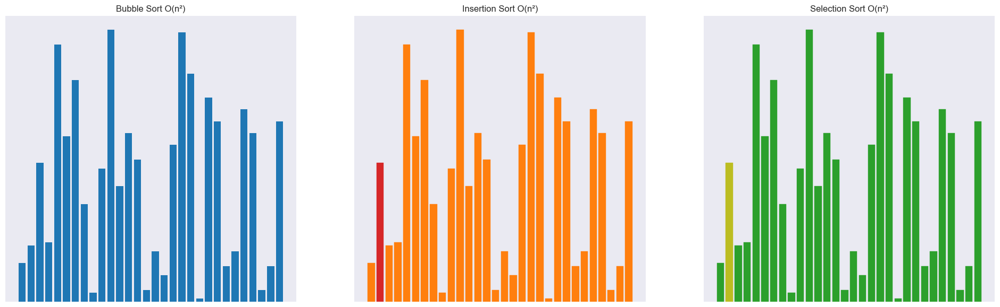

In [4]:
# fucnanimation
algos = [bubbleSort, insertionSort, selectionSort]
fig, ax = plt.subplots(1, len(algos), figsize=(24, 7))

'''
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False
)
'''

# create the frames
barlists = [f(data) for f in algos]
frames = max([len(barlist) for barlist in barlists]) - 1
plots = []
num_frame = 0 
colors = ['tab:blue', 'tab:orange', 'tab:green']
titles = [
        f'Bubble Sort O(n\u00b2)', 
        f'Insertion Sort O(n\u00b2)',
        f'Selection Sort O(n\u00b2)'
]

# initialise the plots
if num_frame == 0:
    for i in range(len(algos)):
        plots.append(ax[i].bar(x, data, color=colors[i]))
        ax[i].set_title(titles[i])
        ax[i].set_xticks([])
        ax[i].set_yticks([])
        
step_insert = step_select = 0
        
def update(num_frame):
    # update the frame
    for i in range(len(algos)):
        barlist = barlists[i]
        # check if barlist still have frame to play
        if len(barlist) <= num_frame + 1:
            continue
            
        y_ = barlist[num_frame + 1]
        # insertion sort
        if i == 1:
            y = y_[0]
            ind_key = y_[1]
            # update the line bar and the color for 
            for k, b in enumerate(plots[i]):
                b.set_height(y[k])
                if k == ind_key:
                    b.set_color('tab:red')
                else:
                    b.set_color('tab:orange')
        
        # seleciton sort
        elif i == 2:
            y = y_[0]
            ind_min = y_[1]
            is_min = y_[2]
            # update the line bar and the color for 
            for k, b in enumerate(plots[i]):
                b.set_height(y[k])
                if k == ind_min:
                    if is_min == 0:
                        b.set_color('tab:olive')
                    elif is_min == 1:
                        b.set_color('tab:orange')
                    else:
                        b.set_color('tab:red')
                else:
                    b.set_color('tab:green')
                
        # other sort algos
        else:
            y = y_
            # update the line bar
            for k, b in enumerate(plots[i]):
                b.set_height(y[k])
        
        ax[i].set_title(titles[i])

anim = animation.FuncAnimation(fig=fig, func=update, frames=frames, interval=100)
HTML(anim.to_jshtml())

# Save

In [ ]:
anim.save(filename="anim.html", writer="html")

In [7]:
# Set up formatting for the movie files
Writer = animation.writers['ffmpeg']
writer = Writer(fps=7, metadata=dict(artist='Me'), bitrate=1800)
anim.save('anim.mp4', writer=writer)